# Scraper

In [1]:
import os
from google_images_download import google_images_download 

In [2]:
root_dir ='data_food_classifier_MG'

In [3]:
response = google_images_download.googleimagesdownload()   #class instantiation

arguments_1 = {"keywords":"fast food, hamburger, kebab, pizza, french fries, chicken popeyes, burito, unhealthy food, unhealthy diet, fatty food, hot dog",
               "limit":100,
               "silent_mode":True,
               "format":"jpg", 
               "prefix":"fast_food",
               "output_directory":os.getcwd(),
               "image_directory":'data_food_classifier_MG'}   #creating list of arguments

response.download(arguments_1)   #passing the arguments to the function

arguments_2 = {"keywords":"healthy meal, vegetables, fruit, fit meal, walnuts dinner, fish dinner, green beans dinner, healthy diet, salad, diet food",
               "limit":100,
               "silent_mode":True,
               "format":"jpg", 
               "prefix":"slow_food",
               "output_directory":os.getcwd(),
               "image_directory":'data_food_classifier_MG'}   #creating list of arguments
response.download(arguments_2)   #passing the arguments to the function



Unfortunately all 100 could not be downloaded because some images were not downloadable. 79 is all we got for this search filter!


Unfortunately all 100 could not be downloaded because some images were not downloadable. 0 is all we got for this search filter!


Unfortunately all 100 could not be downloaded because some images were not downloadable. 86 is all we got for this search filter!


Unfortunately all 100 could not be downloaded because some images were not downloadable. 84 is all we got for this search filter!


Unfortunately all 100 could not be downloaded because some images were not downloadable. 88 is all we got for this search filter!


Unfortunately all 100 could not be downloaded because some images were not downloadable. 77 is all we got for this search filter!


Unfortunately all 100 could not be downloaded because some images were not downloadable. 79 is all we got for this search filter!


Unfortunately all 100 could not be downloaded because some images were not 

({'healthy meal': ['C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 1.healthy-dinner-collection-main-image.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 2.IMG_16162-1.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 3.Healthy-Meal-Prep-.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 4.teriyaki-chicken-meal-prep-4.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 5.best-healthy-dinner-recipes-1567029863.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 6.healthy-chicken-fajitas-meal-prep-square.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 7.dfe06fb20721a3a25f7b515638c7db75.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 8.Blackened-Shrimp-Meal-Prep9.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 9.Meal-Prep-Chickpea-Salad1.jpg',
   'C:\\Users\\Milosz\\data_food_classifier_MG\\slow_food 10.chicken-satay-salad.jpg',
   'C:\\Users\\Milosz\\data_food_classi

# Image preparation


In [4]:
import numpy as np
from PIL import Image
from functions.food_classifier_plotting_functions import plot_accuracy_loss, plot_predictions_or_examples, plot_confusion_matrix
from functions.split_images import split_images
from functions.my_image_data_generator import my_image_data_generator
from functions.correct_predictions import correct_predictions
from functions.my_sequential import my_sequential
%matplotlib inline

Using TensorFlow backend.


Some images may have been saved with the wrong extension.

In [5]:
root_listdir = os.listdir(root_dir)
counter = 0

for index, element in enumerate(root_listdir):
    filename = root_dir + '/' + element
    try:
        im = Image.open(filename)
        im.verify() #I perform also verify, don't know if he sees other types o defects
        im.close() #reload is necessary in my case
    except (OSError, ValueError):
        os.remove(filename)
        root_listdir[index] = 0
        counter += 1

print('%d files deleted due to OSError and  ValueError.' %counter)

0 files deleted due to OSError and  ValueError.


Splitting images into train, test and valid sets.

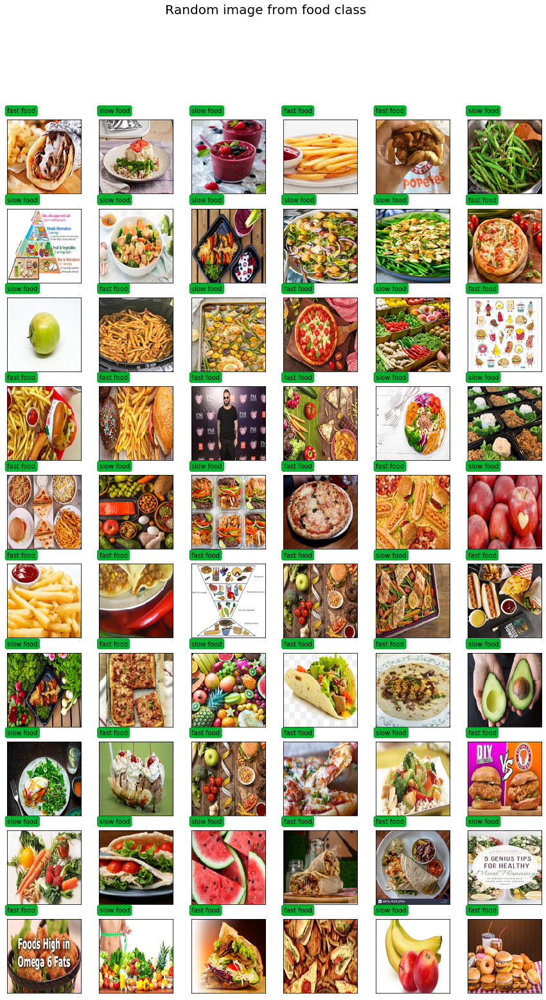

In [6]:
root_listdir = [i for i in root_listdir if i != 0]
list_of_images_indices = np.random.choice(len(root_listdir), 60)
list_of_images_names = [root_listdir[i] for i in list_of_images_indices]

plot_predictions_or_examples(list_of_images_names, title="Random image from food class")

In [7]:
fast_food_list = [i for i in root_listdir if 'fast_food' in i]
slow_food_list = [i for i in root_listdir if 'slow_food' in i]

train_examples_fast, valid_examples_fast, test_examples_fast = split_images(fast_food_list, root_dir, '/fast_food/')
train_examples_slow, valid_examples_slow, test_examples_slow = split_images(slow_food_list, root_dir, '/slow_food/')

train_examples = train_examples_fast + train_examples_slow
valid_examples = valid_examples_fast + valid_examples_slow
test_examples = test_examples_fast + test_examples_slow

# Classification models

In [8]:
%load_ext tensorboard

import tensorflow as tf
import keras
import random
import itertools
import datetime

from sklearn.metrics import confusion_matrix

from keras.preprocessing.image import ImageDataGenerator
from keras import applications, backend as K
from keras.models import  Model
from keras.layers import (
    Dense,
    Activation,
    Conv2D,
    MaxPool2D,
    Flatten,
    BatchNormalization,
    Dropout,
)
from keras.layers.core import Dense, Flatten
from keras.layers.normalization import BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.metrics import categorical_crossentropy
from keras_lr_finder import LRFinder
from keras.callbacks import TensorBoard

In [9]:
channels = 3
img_height = img_width = 224
batch_size = 32

train_folder = root_dir + "/train"
test_folder = root_dir + "/test"
valid_folder = root_dir + "/valid"

classes = ["slow_food", "fast_food"]

## Logistic regression

First attempt should be simple so we will check Logistic Regression on our data.

In [10]:
train_generator = my_image_data_generator(
    train_folder, class_mode="binary", shuffle=True
)
test_generator = my_image_data_generator(test_folder, class_mode="binary", shuffle=True)

x_train, y_train = next(train_generator)
x_test, y_test = next(test_generator)

Found 1055 images belonging to 2 classes.
Found 226 images belonging to 2 classes.


In [11]:
from sklearn.linear_model import LogisticRegression

logistic = LogisticRegression(solver="liblinear")
logistic.fit(x_train.reshape(batch_size, -1), y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [12]:
y_pred = logistic.predict(x_test.reshape(len(x_test), -1))
np.count_nonzero(y_pred == y_test) / len(y_test)

0.65625

Model accuracy is not satisfactory.

## Build Fine-tuned VGG16 model

Now we will try to use pretrained model VGG16. The model achieves 92.7% top-5 test accuracy in ImageNet, which is a dataset of over 14 million images belonging to 1000 classes.


In [13]:
K.clear_session()
vgg16_model = applications.vgg16.VGG16()
vgg16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [14]:
model = my_sequential()
for layer in vgg16_model.layers[:-3]:
    model.add(layer)

We should pop dense layers.

In [15]:
for layer in model.layers:
    layer.trainable = False

model.add(Dense(2, activation="sigmoid"))
model.summary()

Model: "my_sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)   

In [16]:
train_batches = my_image_data_generator(train_folder, batch_size=10, classes=classes)
test_batches = my_image_data_generator(test_folder, batch_size=10, classes=classes)
valid_batches = my_image_data_generator(valid_folder, batch_size=4, classes=classes)

Found 1055 images belonging to 2 classes.
Found 226 images belonging to 2 classes.
Found 226 images belonging to 2 classes.


## Train the fine-tuned VGG16 model

In [17]:
model.compile(Adam(lr=0.001), loss="categorical_crossentropy", metrics=["accuracy"])

log_dir = os.path.join(
    "logs",
    "fit",
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S"),
)
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

history = model.fit_generator(
    train_batches,
    train_examples // 10,
    validation_data=valid_batches,
    validation_steps=valid_examples // 4 + 1,
    epochs=10,
    verbose=2,
    callbacks=[tensorboard_callback],
)

predictions = model.predict_generator(test_batches, test_examples // 10)

Epoch 1/10
 - 217s - loss: 0.7196 - accuracy: 0.4995 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 2/10
 - 216s - loss: 0.6931 - accuracy: 0.5091 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 3/10
 - 217s - loss: 0.6931 - accuracy: 0.4900 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 4/10
 - 216s - loss: 0.6931 - accuracy: 0.5091 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 5/10
 - 216s - loss: 0.6931 - accuracy: 0.4986 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 6/10
 - 216s - loss: 0.6931 - accuracy: 0.5206 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 7/10
 - 217s - loss: 0.6931 - accuracy: 0.4876 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 8/10
 - 215s - loss: 0.6931 - accuracy: 0.5019 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 9/10
 - 642s - loss: 0.6931 - accuracy: 0.4900 - val_loss: 0.6931 - val_accuracy: 0.5044
Epoch 10/10
 - 219s - loss: 0.6931 - accuracy: 0.5378 - val_loss: 0.6931 - val_accuracy: 0.5044


In [18]:
predictions = model.predict_generator(test_batches, test_examples // 10)
correct_predictions(test_batches, predictions)

Correct predictions: 0.4690265486725664


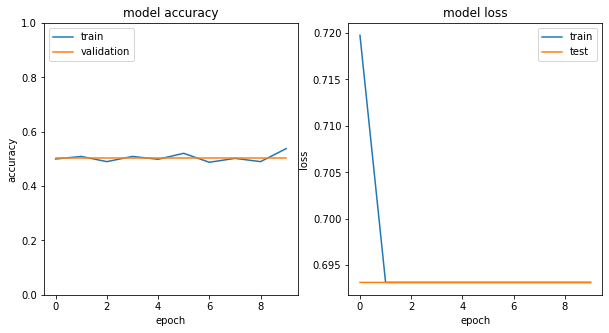

In [19]:
plot_accuracy_loss(history)

In [20]:
c = list(
    zip(
        [i.split("\\")[1] for i in test_batches.filenames],
        [1 if i[0] >= 0.5 else 0 for i in predictions],
    )
)
random.shuffle(c)

filenames, preds = zip(*c)

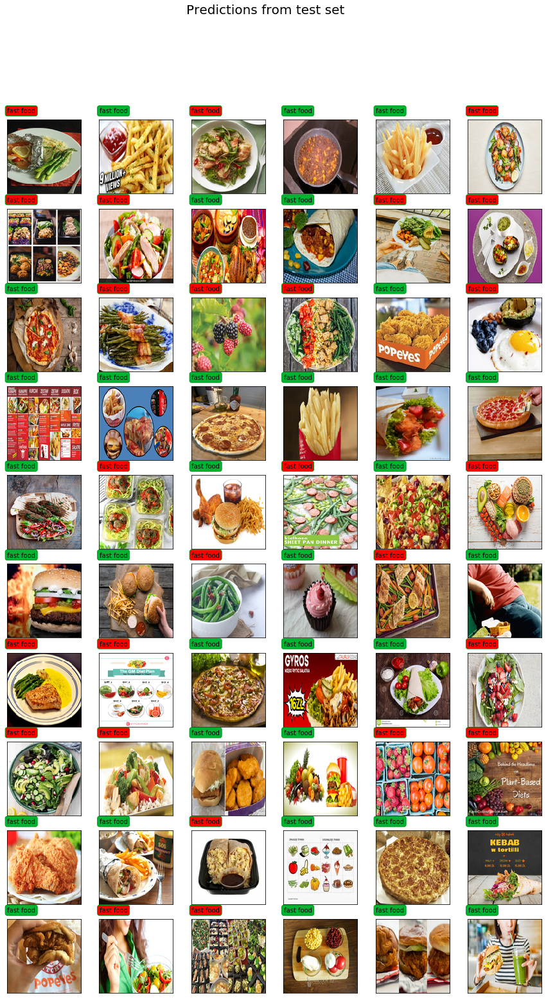

In [21]:
wrong_predictions = plot_predictions_or_examples(filenames, preds)

In [22]:
wrong_predictions

['slow_food 61.fish-packet-asparagus-and-rice.jpg',
 'slow_food 28.light-dinners-coconut-shrimp-rice-1566498330.jpg',
 'slow_food 40.Al-Desko-Steak-Salad-Leftovers-Recipe.jpg',
 'slow_food 46.facebook-cover-art.jpg',
 'slow_food 10.rejsh0to_protein-rich-salads_625x300_27_September_19.jpg',
 'slow_food 83.insta-14-3.jpg',
 'slow_food 58.Stuffed-avocado.jpg',
 'slow_food 89.green-bean-bundles-6.jpg',
 'slow_food 61.20190719-140436-blackberry_79345.jpg',
 'slow_food 83.Stocksy_txpa269f3e29MP100_Medium_1257410-58c70b893df78c353cdeb0bd.jpg',
 'slow_food 77.a2679-1534700268-800.jpg',
 'slow_food 12.Healthy-Meal-Prep-Baked-Turkey-Meatballs--500x500.jpg',
 'slow_food 82.easy-kielbasa-sheet-pan-dinner-with-veggies-image.jpg',
 'slow_food 63.secret-to-a-healthy-heart.jpg',
 'slow_food 13.bacon-green-beans-side-dish-keto-gluten-free-whole30-paleo-4-of-4-1.jpg',
 'slow_food 3.1504633899842-recipeMainImagePath.jpg',
 'slow_food 31.salmon-518497_1280-1080x675.jpg',
 'slow_food 5.GM-Diet--Is-It-The-B

In [23]:
test_labels = np.array([0 if "slow_food" in f else 1 for f in test_batches.filenames])[
    : len(predictions)
]
cm = confusion_matrix(test_labels, np.round(predictions[:, 0]))

Confusion matrix, without normalization
[[  0 114]
 [  0 106]]


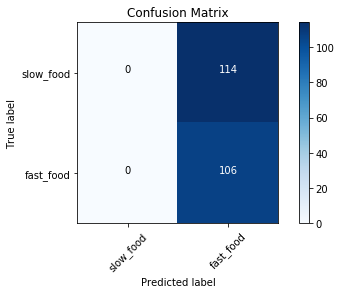

In [24]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix")

Model performed better than simple guessing, but it is still less accurate than Logistic Regression.

# Sequential model


Pretrained model didn't pass the exam. Now we will try create our own model.


In [25]:
K.clear_session()
model = my_sequential()

model.add(
    Conv2D(
        8,
        kernel_size=(3, 3),
        padding="same",
        input_shape=(img_width, img_height, channels),
    )
)
model.add(Activation("relu"))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(16, kernel_size=(3, 3), padding="same"))
model.add(BatchNormalization())
model.add(Activation("relu"))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Conv2D(32, kernel_size=(3, 3), padding="same"))
model.add(BatchNormalization())
model.add(Activation("relu"))
model.add(MaxPool2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(2, activation="sigmoid"))
model.compile(optimizer="rmsprop", loss="binary_crossentropy", metrics=["accuracy"])
model.summary()


Model: "my_sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 8)       224       
_________________________________________________________________
activation_1 (Activation)    (None, 224, 224, 8)       0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 8)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 16)      1168      
_________________________________________________________________
batch_normalization_1 (Batch (None, 112, 112, 16)      64        
_________________________________________________________________
activation_2 (Activation)    (None, 112, 112, 16)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 56, 56, 16)    

In [26]:
train_batches = my_image_data_generator(
    train_folder, classes=classes, shuffle=True
)
test_batches = my_image_data_generator(test_folder, classes=classes)

Found 1055 images belonging to 2 classes.
Found 226 images belonging to 2 classes.


In [27]:
model.fit_generator(train_batches, train_examples // batch_size, epochs=2)

Epoch 1/2
32/32 [==============================] - 36s 1s/step - loss: 3.1560 - accuracy: 0.6256
Epoch 2/2
32/32 [==============================] - 36s 1s/step - loss: 1.4072 - accuracy: 0.7395


In [28]:
y_pred = model.predict_generator(test_batches, test_examples // batch_size, workers=4)
correct_predictions(test_batches, y_pred)

Correct predictions: 0.504424778761062


In [29]:
c = list(
    zip(
        [i.split("\\")[1] for i in test_batches.filenames],
        [1 if i[0] >= 0.5 else 0 for i in y_pred],
    )
)
random.shuffle(c)

filenames_2, preds_2 = zip(*c)

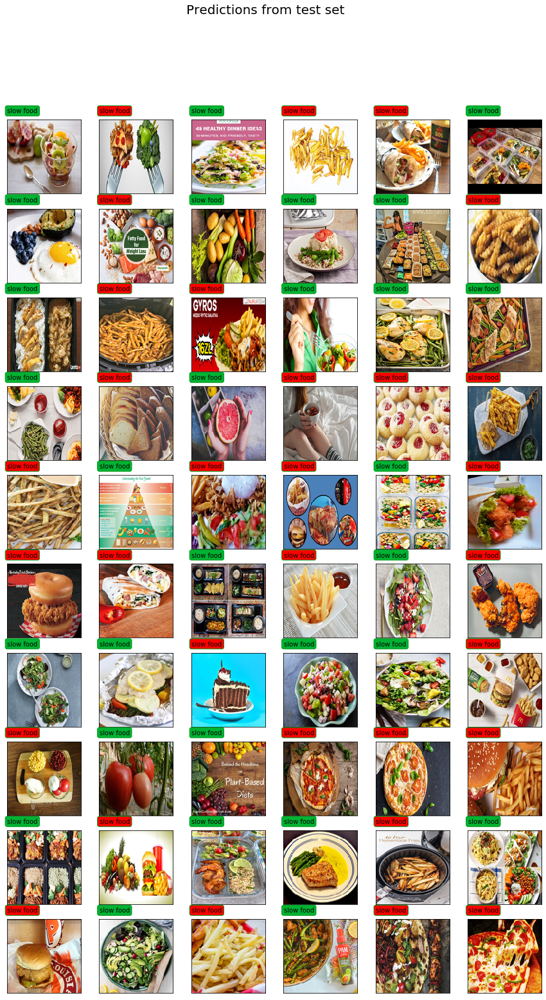

In [30]:
wrong_predictions_2 = plot_predictions_or_examples(filenames_2, preds_2)

In [31]:
wrong_predictions_2

['fast_food 76.1475-shutterstock_295119902.jpg',
 'fast_food 56.cold-fry-frites-patricia-wells-030617.jpg',
 'fast_food 47.P6101542.jpg',
 'fast_food 27.Big__fatty.jpg',
 'fast_food 32.FryCloseupOPT-480x270.jpg',
 'fast_food 28.IMG_5038.jpg',
 'fast_food 62.006.jpg',
 'fast_food 48.white-and-brown-bread-which-may-be-an-unhealthy-food.jpg',
 'fast_food 63.An-Unhealthy-Diet-Could-Hurt-Your-Brain-752x472.jpg',
 'fast_food 51.175841927-463310.jpg',
 'fast_food 70.french-fries-salted-egg-50461022.jpg',
 'fast_food 60.air-fries-recipe-for-the-best-healthy-fries_3729.jpg',
 'fast_food 81.Kebab-800x450.jpg',
 'fast_food 78.School+Junk+Food.jpg',
 'fast_food 64.Twister%2Bz%2BKFC%2B14.jpg',
 'fast_food 46.kfc.jpg',
 'fast_food 79.DvgP42uXgAETT7V.jpg',
 'fast_food 59.15339996.jpg',
 'fast_food 25.OCR-L-POPEYES-1022-1.jpg',
 'fast_food 51.BN-RN270_PORTIO_P_20170106154933.jpg',
 'fast_food 19.gf-1y8X-q6rp-7H9N_mcdonalds-przyjedzie-do-ciebie-664x442-nocrop.jpg',
 'fast_food 54.burito_s_kuricej_i_fas

In [32]:
test_labels = np.array([0 if "slow_food" in f else 1 for f in test_batches.filenames])[
    : len(y_pred)
]
cm = confusion_matrix(test_labels, np.round(y_pred[:, 0]))

Confusion matrix, without normalization
[[114   0]
 [110   0]]


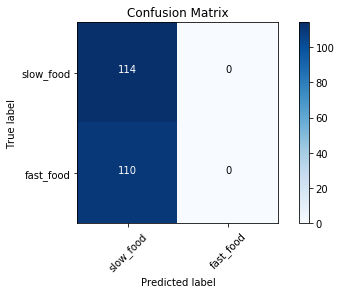

In [33]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix")

Model is much worse than previous ones. It means that simple model won't be enough, because we don't have big dataset.


## Transfer learning

Last attempt is transfer learning. We will use VGG16 again but this time in other way.


In [34]:
K.clear_session()
train_batches_1 = my_image_data_generator(train_folder, class_mode=None)
train_batches_2 = my_image_data_generator(train_folder, class_mode=None)
valid_batches = my_image_data_generator(valid_folder, class_mode=None)
test_batches = my_image_data_generator(test_folder, class_mode="binary")

Found 1055 images belonging to 2 classes.
Found 1055 images belonging to 2 classes.
Found 226 images belonging to 2 classes.
Found 226 images belonging to 2 classes.


In [35]:
model = applications.VGG16(include_top=False, weights="imagenet")
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

Training VGG16 on our data should give us the bottleneks of our images. In this case we will use VGG16 predictions to train our sequential model. It means that we changed sets of images into sets of bottlenecks which could be more helpful in detecting category.


In [36]:
bottleneck_features_train = model.predict_generator(
    train_batches_1, train_examples // batch_size, verbose=1, workers=4
)
bottleneck_features_valid = model.predict_generator(
    valid_batches, test_examples // batch_size, verbose=1, workers=4
)
bottleneck_features_test = model.predict_generator(
    test_batches, test_examples // batch_size, verbose=1, workers=4
)

bottleneck_features_train.shape


7/7 [==============================] - 40s 6s/step


(1024, 7, 7, 512)

In [37]:
model = my_sequential()
model.add(Flatten(input_shape=bottleneck_features_train.shape[1:]))
model.add(Dense(256, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(1, activation="sigmoid"))

for layer in model.layers[:-1]:
    layer.trainable = False

model.compile(
    optimizer=RMSprop(learning_rate=0.01, rho=0.9),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

log_dir = os.path.join(
    "logs",
    "fit",
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S"),
)
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

model.summary()

Model: "my_sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               6422784   
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 6,423,041
Trainable params: 257
Non-trainable params: 6,422,784
_________________________________________________________________


In [38]:
labels = np.array([0 if "slow_food" in f else 1 for f in train_batches_2.filenames])[
    : len(bottleneck_features_train)
]
val_labels = np.array([0 if "slow_food" in f else 1 for f in valid_batches.filenames])[
    : len(bottleneck_features_valid)
]

Epoch 1/20
1024/1024 [==============================] - 0s 255us/step - loss: 0.8079 - accuracy: 0.5078
Epoch 2/20
1024/1024 [==============================] - 0s 168us/step - loss: 0.8230 - accuracy: 0.4922
Epoch 3/20
1024/1024 [==============================] - 0s 191us/step - loss: 0.7936 - accuracy: 0.4893
Epoch 4/20
1024/1024 [==============================] - 0s 178us/step - loss: 0.8005 - accuracy: 0.5156
Epoch 5/20
1024/1024 [==============================] - 0s 175us/step - loss: 0.7965 - accuracy: 0.5205
Epoch 6/20
1024/1024 [==============================] - 0s 176us/step - loss: 0.8018 - accuracy: 0.4961
Epoch 7/20
1024/1024 [==============================] - 0s 174us/step - loss: 0.8204 - accuracy: 0.5049
Epoch 8/20
1024/1024 [==============================] - 0s 182us/step - loss: 0.8069 - accuracy: 0.4805
Epoch 9/20
1024/1024 [==============================] - 0s 168us/step - loss: 0.7981 - accuracy: 0.48340s - loss: 0.7901 - accuracy: 0.
Epoch 10/20
1024/1024 [=========

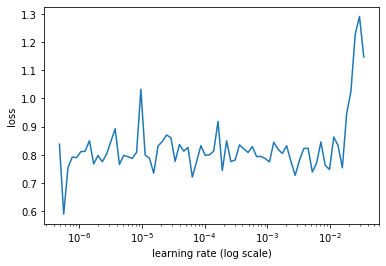

In [39]:
lr_finder = LRFinder(model)
lr_finder.find(bottleneck_features_train, labels, 0.0000001, 1, 200, 20)
lr_finder.plot_loss()

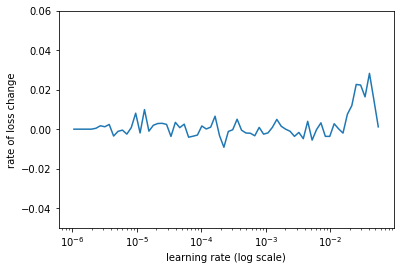

In [40]:
lr_finder.plot_loss_change(
    sma=20, n_skip_beginning=15, n_skip_end=2, y_lim=(-0.05, 0.06)
)

In [41]:
model.fit(
    bottleneck_features_train,
    labels,
    validation_data=(bottleneck_features_valid[: len(val_labels)], val_labels),
    epochs=20,
    batch_size=batch_size,
)
for layer in model.layers[:-1]:
    layer.trainable = True

model.compile(
    optimizer=RMSprop(learning_rate=0.001, rho=0.9),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

history_2 = model.fit(
    bottleneck_features_train,
    labels,
    validation_data=(bottleneck_features_valid[: len(val_labels)], val_labels),
    epochs=20,
    batch_size=batch_size,
    callbacks=[tensorboard_callback],
)

Train on 1024 samples, validate on 224 samples
Epoch 1/20
1024/1024 [==============================] - 0s 341us/step - loss: 0.7660 - accuracy: 0.5107 - val_loss: 0.6624 - val_accuracy: 0.6161
Epoch 2/20
1024/1024 [==============================] - 0s 320us/step - loss: 0.7118 - accuracy: 0.5576 - val_loss: 0.6740 - val_accuracy: 0.5714
Epoch 3/20
1024/1024 [==============================] - 0s 318us/step - loss: 0.6760 - accuracy: 0.5967 - val_loss: 0.6752 - val_accuracy: 0.5491
Epoch 4/20
1024/1024 [==============================] - 0s 315us/step - loss: 0.6575 - accuracy: 0.6123 - val_loss: 0.7017 - val_accuracy: 0.5446
Epoch 5/20
1024/1024 [==============================] - 0s 320us/step - loss: 0.6534 - accuracy: 0.6357 - val_loss: 0.6257 - val_accuracy: 0.6562
Epoch 6/20
1024/1024 [==============================] - 0s 321us/step - loss: 0.6425 - accuracy: 0.6338 - val_loss: 0.6193 - val_accuracy: 0.6607
Epoch 7/20
1024/1024 [==============================] - 0s 326us/step - loss:

In [42]:
test_labels = np.array([0 if "slow_food" in f else 1 for f in test_batches.filenames])[
    : len(bottleneck_features_test)
]
y_test_pred = model.predict_classes(bottleneck_features_test)
accuracy = np.count_nonzero(
    y_test_pred[: len(test_labels)].ravel() == test_labels
) / len(test_labels)

print("\nThe accuracy is: " + str(accuracy))


The accuracy is: 0.8035714285714286


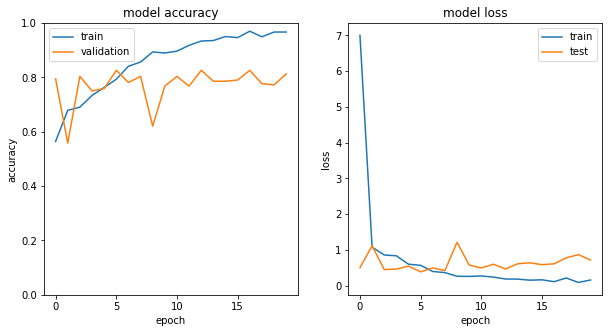

In [43]:
plot_accuracy_loss(history_2)

This model is the most promising one.

In [44]:
cm = confusion_matrix(test_labels, np.round(y_test_pred[: len(test_labels)]))

Confusion matrix, without normalization
[[82 30]
 [14 98]]


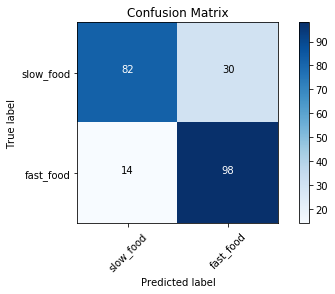

In [45]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix")

Normalized confusion matrix
[[0.73214286 0.26785714]
 [0.125      0.875     ]]


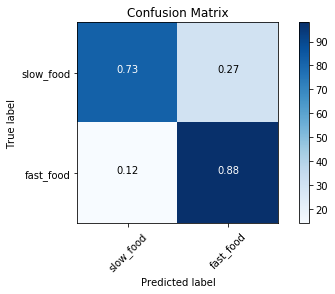

In [46]:
plot_confusion_matrix(cm, classes, title="Confusion Matrix", normalize=True)

Prediction on the test set are also much more accurate thane previous ones.

In [47]:
c = list(zip([i.split("\\")[1] for i in test_batches.filenames], y_test_pred))
random.shuffle(c)

filenames_3, preds_3 = zip(*c)

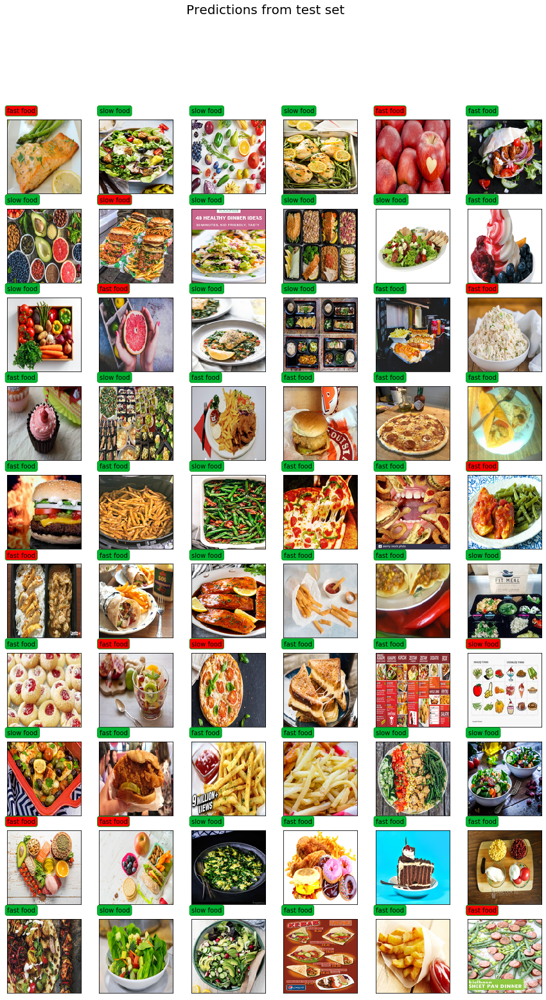

In [48]:
wrong_predictions_3 = plot_predictions_or_examples(filenames_3, preds_3)

In [49]:
wrong_predictions_3

['slow_food 9.salmon.jpg',
 'slow_food 42.47425871_401.jpg',
 'fast_food 66.n_9726-1.jpg',
 'slow_food 34.healthy-fruits-1296x728.jpg',
 'slow_food 72.Classic-Chicken-Salad-2.jpg',
 'slow_food 76.Moroccan-Chicken-with-Green-Beans.jpg',
 'slow_food 71.74b153_fit-meal-catering-dietetyczny-lodz-lodzkie-zdjecia.jpg',
 'slow_food 79.fresh_fruit_salad_61942_16x9.jpg',
 'fast_food 13.pizza-930x530.jpg',
 'fast_food 54.f42dbda63b75be1fc3251648954e1426.jpg',
 'slow_food 63.secret-to-a-healthy-heart.jpg',
 'slow_food 38.iStock-588354332-5a4baf7c7bb28300379b7522.jpg',
 'slow_food 82.easy-kielbasa-sheet-pan-dinner-with-veggies-image.jpg']

## Tensorboard

In [53]:
from tensorboard import notebook
notebook.list() # View open TensorBoard instances

Known TensorBoard instances:
  - port 6006: logdir logs/fit (started 10:40:12 ago; pid 21392)


In [54]:
notebook.display(port=6006, height=1000) 

Selecting TensorBoard with logdir logs/fit (started 10:40:23 ago; port 6006, pid 21392).
